In [7]:
import os
import random

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.optim as optim

from tqdm.auto import tqdm
from IPython.display import clear_output

from data_utils import (
    load_data,
    split_data,
    get_dataloaders,
    extract_ground_truth,
    get_raw_predictions,
    to_output_format,
    remove_overlaps,
    evaluate_image,
    compute_metrics
)

from augmentation import (
    augment,
    scale_image_and_labels,
    rotate_image_and_labels,
    translate_image_and_labels
)

from visualization import (
    visualize_sample,
    visualize_augmentations,
    visualize_batch
)

from model import DiceDetector, DiceLoss

In [2]:
data = load_data()
print(f"Loaded {len(data)} images")

train, val, test = split_data(data)
print(f"Train: {len(train)}, Val: {len(val)}, Test: {len(test)}")


Loaded 171 images
Train: 88, Val: 23, Test: 60


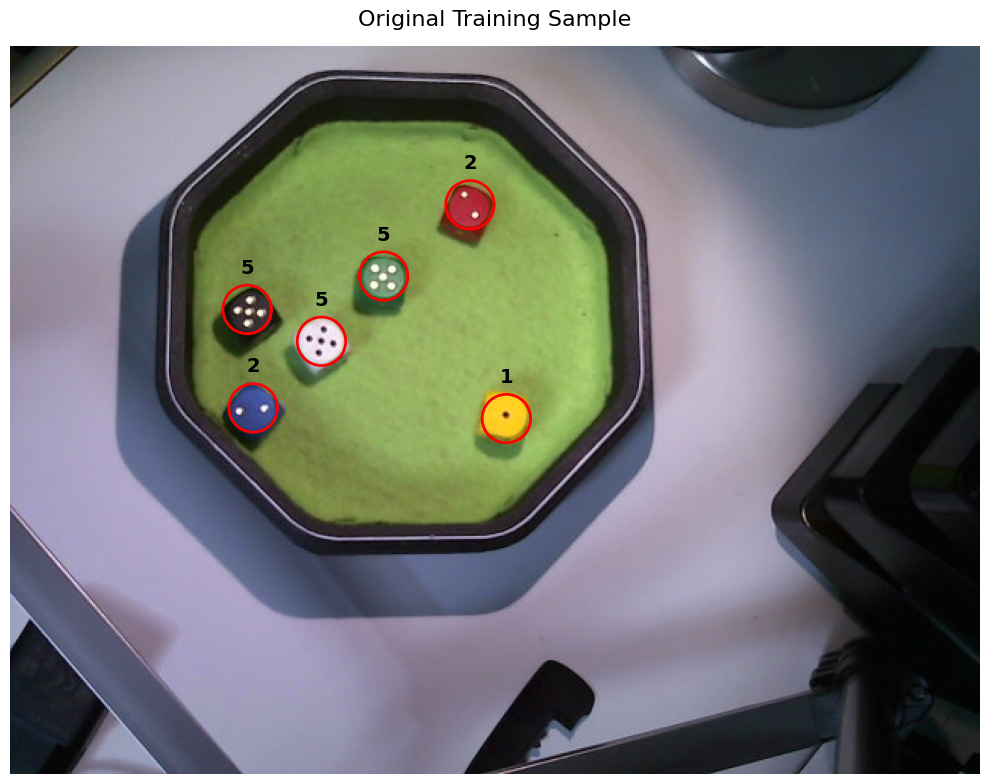

In [3]:
sample = train[0]
visualize_sample(sample['image'], sample['labels'], "Original Training Sample")

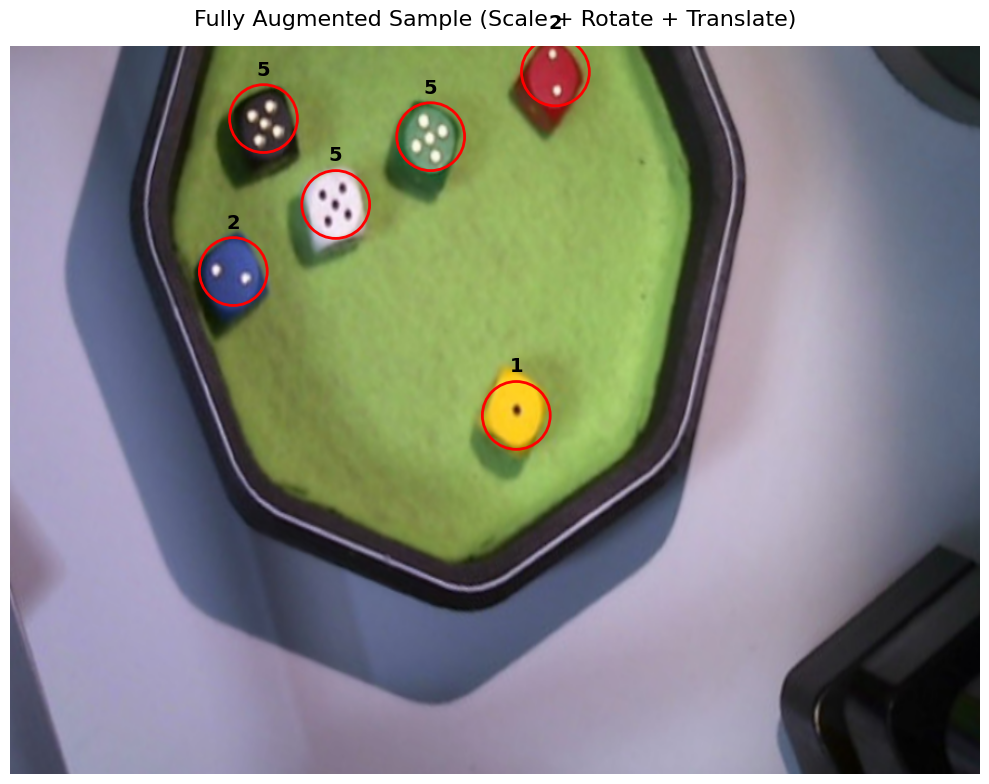

Augmented image shape: (672, 896, 3)
Number of dice after augmentation: 6


In [6]:
img_aug, labels_aug = augment(sample['image'], sample['labels'])
visualize_sample(img_aug, labels_aug, "Fully Augmented Sample (Scale + Rotate + Translate)")
print(f"Augmented image shape: {img_aug.shape}")
print(f"Number of dice after augmentation: {len(labels_aug['x'])}")


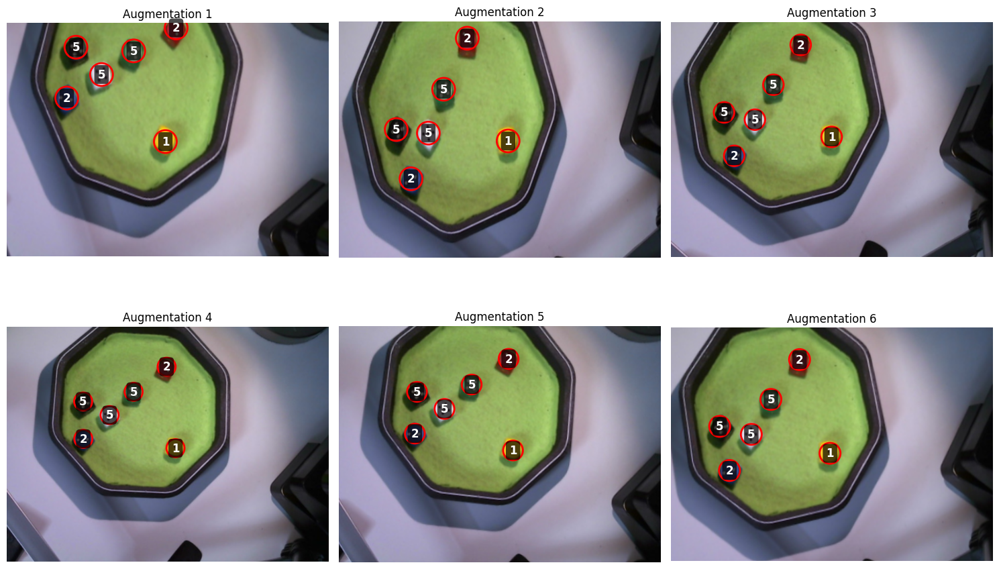

In [21]:
visualize_augmentations(sample)


Original shape: (480, 640, 3)
Scaled shape:   (585, 780, 3)
Original radius: 16.00
Scaled radius:   19.51


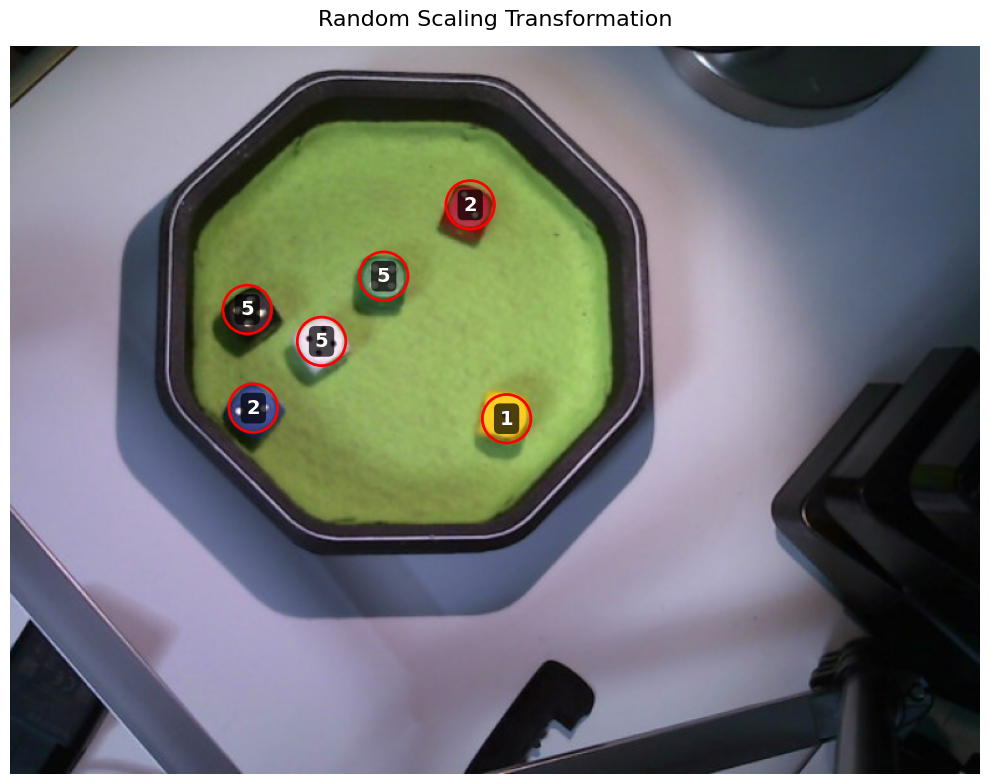

In [22]:
img, labels = sample['image'].copy(), {k: v.copy() for k, v in sample['labels'].items()}

img_scaled, labels_scaled = scale_image_and_labels(img, labels)

print(f"Original shape: {img.shape}")
print(f"Scaled shape:   {img_scaled.shape}")
print(f"Original radius: {labels['radius'][0]:.2f}")
print(f"Scaled radius:   {labels_scaled['radius'][0]:.2f}")

visualize_sample(img_scaled, labels_scaled, "Random Scaling Transformation")

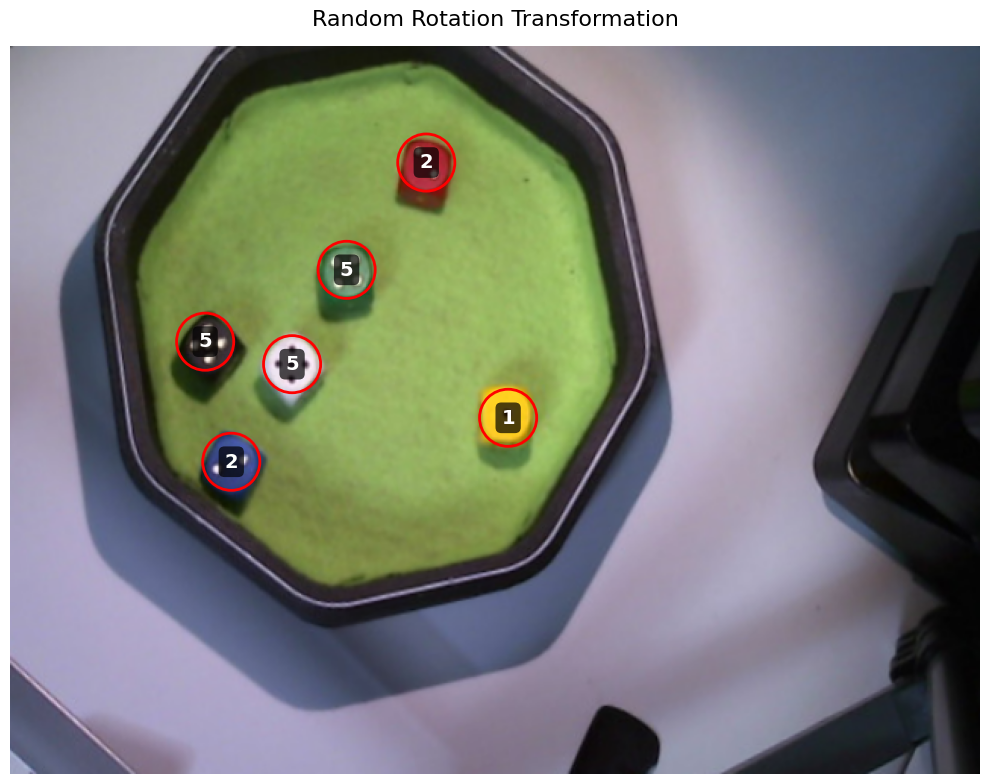

In [23]:
img_rotated, labels_rotated = rotate_image_and_labels(img, labels)
visualize_sample(img_rotated, labels_rotated, "Random Rotation Transformation")


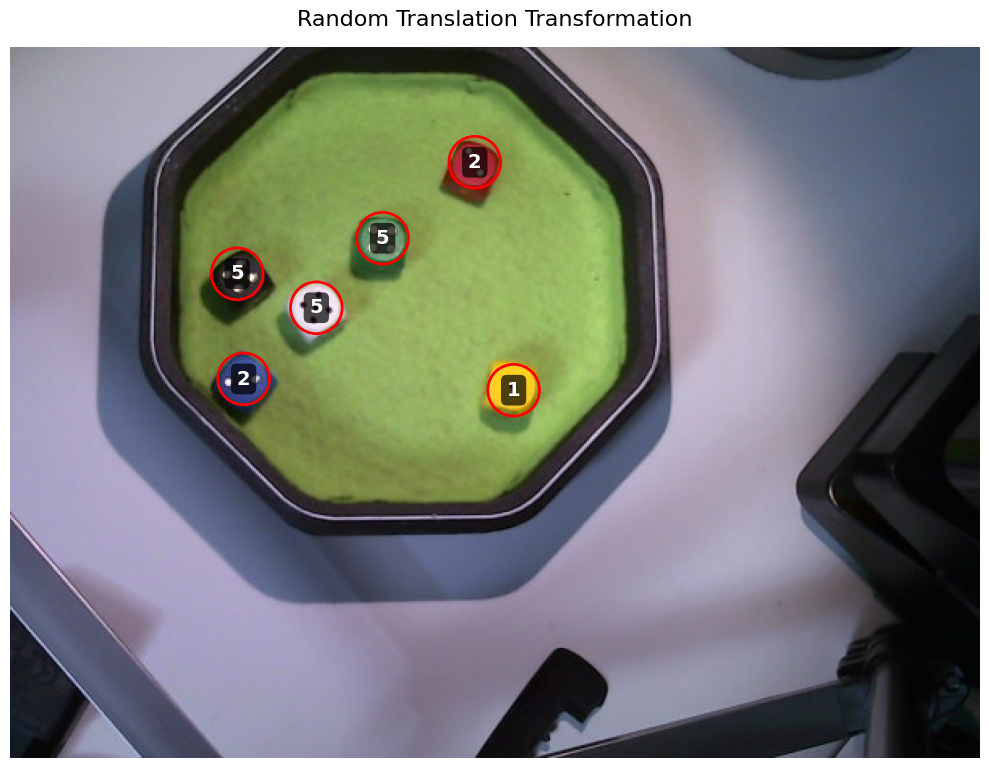

In [24]:
img_translated, labels_translated = translate_image_and_labels(img, labels)
visualize_sample(img_translated, labels_translated, "Random Translation Transformation")


In [3]:
train_loader, val_loader, test_loader = get_dataloaders(batch_size=4)

images, targets_cls, targets_reg, masks = next(iter(train_loader))

print(f"Images: {images.shape}")        # [8, 3, H, W]
print(f"Classes: {targets_cls.shape}")  # [8, 30, 40]
print(f"Regression: {targets_reg.shape}")# [8, 3, 30, 40]
print(f"Masks: {masks.shape}")          # [8, 30, 40]

Images: torch.Size([4, 3, 592, 800])
Classes: torch.Size([4, 37, 50])
Regression: torch.Size([4, 3, 37, 50])
Masks: torch.Size([4, 37, 50])


In [26]:
model = DiceDetector()

dummy_input = torch.randn(1, 3, 480, 640)

cls_out, reg_out = model(dummy_input)

print(f"Input Shape:  {dummy_input.shape}")
print(f"Class Shape:  {cls_out.shape}")
print(f"Reg Shape:    {reg_out.shape}")

Input Shape:  torch.Size([1, 3, 480, 640])
Class Shape:  torch.Size([1, 7, 30, 40])
Reg Shape:    torch.Size([1, 3, 30, 40])


In [27]:
print(model)

DiceDetector(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats

Metric          | Value     
----------------------------
Epoch           | 29/30
Train Loss      | 1.139373
Val Loss        | 1.629380


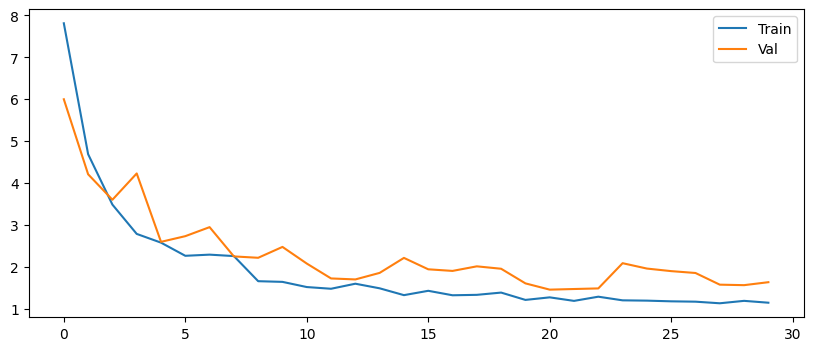

In [37]:
CHECKPOINT_PATH = 'dice_model1.pth'
NUM_EPOCHS = 30
LR = 1e-4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = DiceDetector().to(device)
optimizer = optim.Adam(model.parameters(), lr=LR)
criterion = DiceLoss().to(device)

start_epoch = 0
train_losses = []
val_losses = []

if os.path.exists(CHECKPOINT_PATH):
    checkpoint = torch.load(CHECKPOINT_PATH)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    train_losses = checkpoint.get('train_losses', [])
    val_losses = checkpoint.get('val_losses', [])
    print(f"Resuming from epoch {start_epoch}")
from tqdm.auto import tqdm

for epoch in range(start_epoch, NUM_EPOCHS):
    model.train()
    running_loss = 0.0
    
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}", leave=False)
    for imgs, t_cls, t_reg, masks in pbar:
        imgs, t_cls, t_reg, masks = imgs.to(device), t_cls.to(device), t_reg.to(device), masks.to(device)
        
        optimizer.zero_grad()
        p_cls, p_reg = model(imgs)
        loss = criterion(p_cls, p_reg, t_cls, t_reg, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        pbar.set_postfix({'loss': loss.item()})
    
    train_losses.append(running_loss / len(train_loader))

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, t_cls, t_reg, masks in val_loader:
            imgs, t_cls, t_reg, masks = imgs.to(device), t_cls.to(device), t_reg.to(device), masks.to(device)
            p_cls, p_reg = model(imgs)
            loss = criterion(p_cls, p_reg, t_cls, t_reg, masks)
            val_loss += loss.item()
    
    val_losses.append(val_loss / len(val_loader))

    # Save and Plot
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'val_losses': val_losses
    }, CHECKPOINT_PATH)    
    clear_output(wait=True)
    
    # Epoch Summary Table
    print(f"{'Metric':<15} | {'Value':<10}")
    print("-" * 28)
    print(f"{'Epoch':<15} | {epoch}/{NUM_EPOCHS}")
    print(f"{'Train Loss':<15} | {train_losses[-1]:.6f}")
    print(f"{'Val Loss':<15} | {val_losses[-1]:.6f}")
    
    plt.figure(figsize=(10, 4))
    plt.plot(train_losses, label='Train')
    plt.plot(val_losses, label='Val')
    plt.legend()
    plt.show()

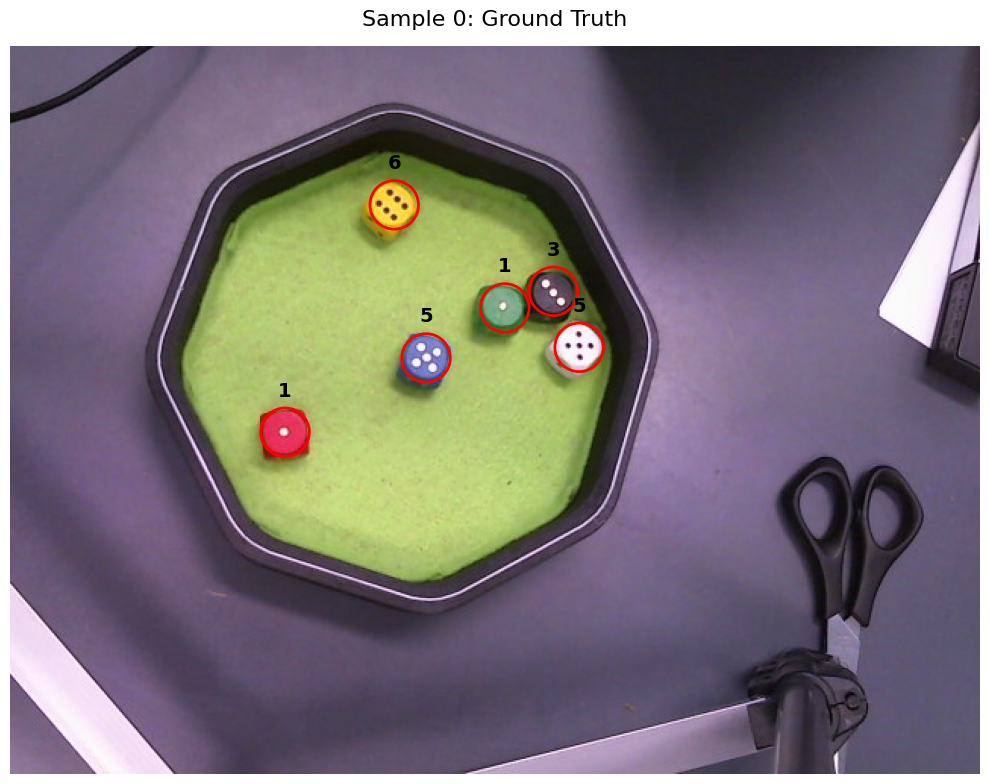

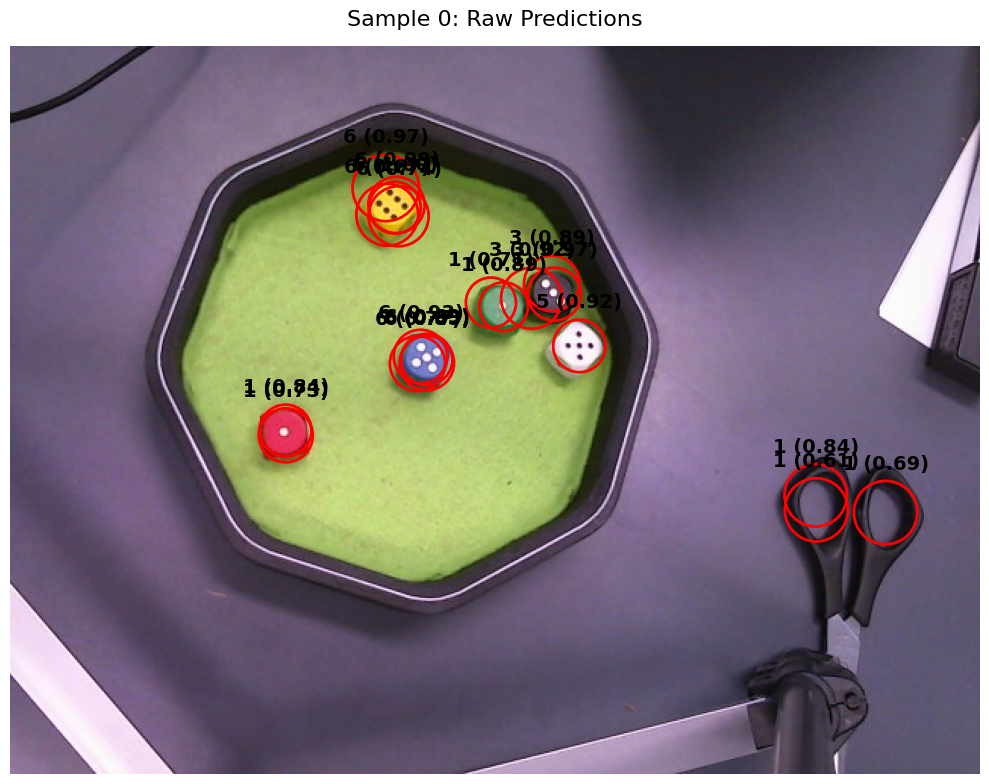

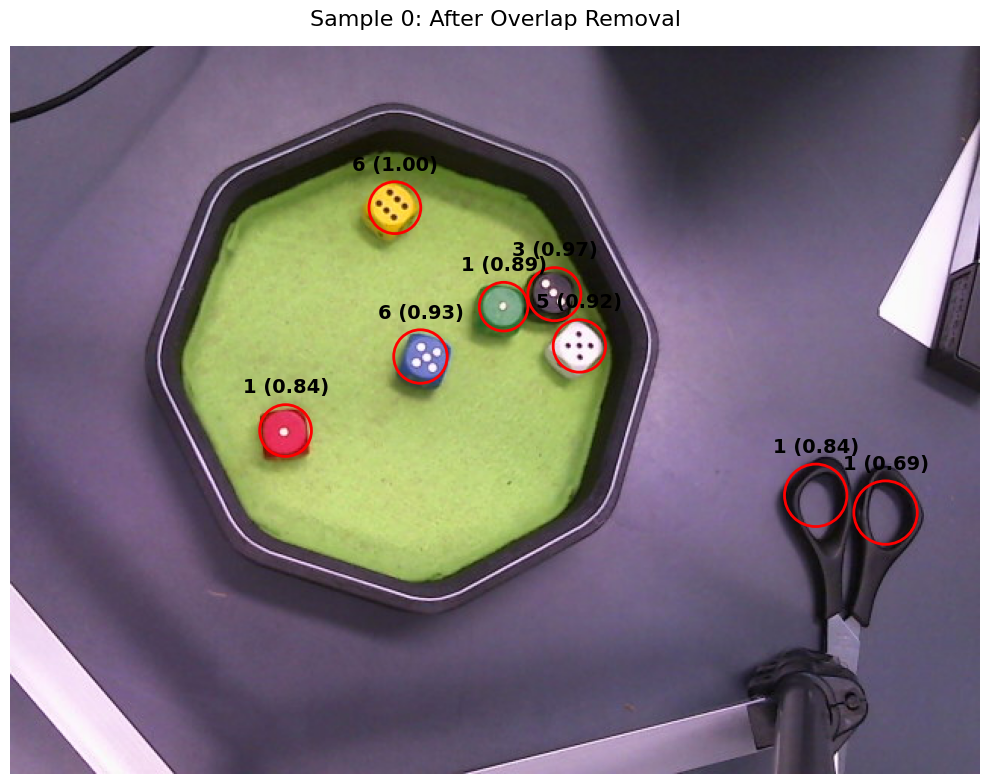

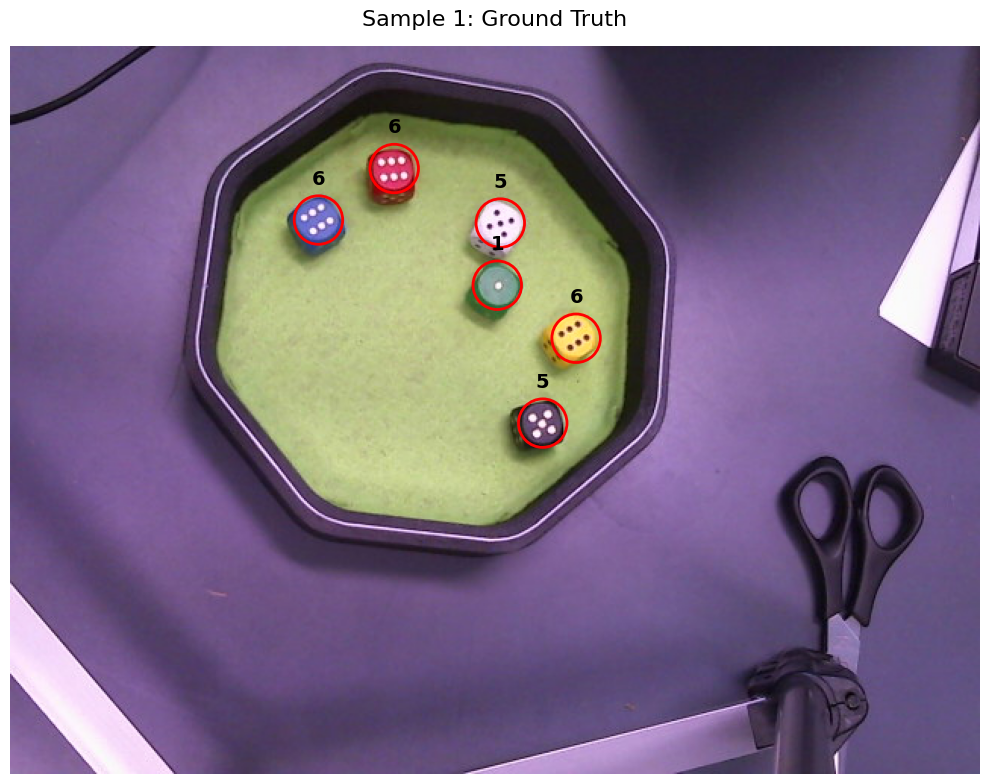

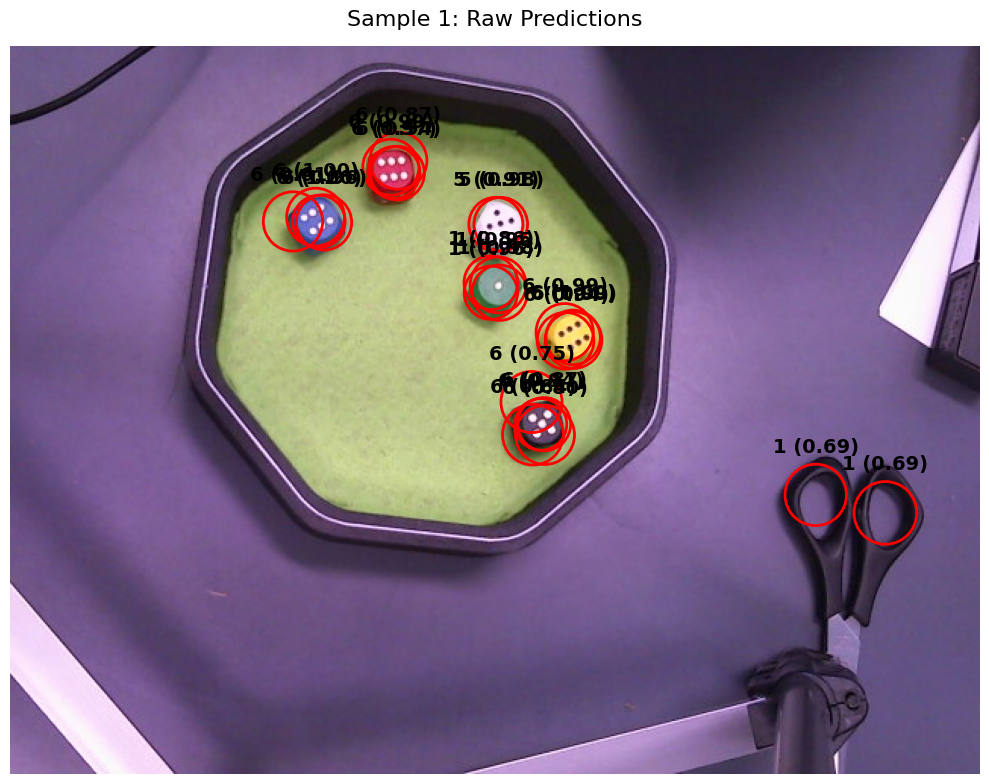

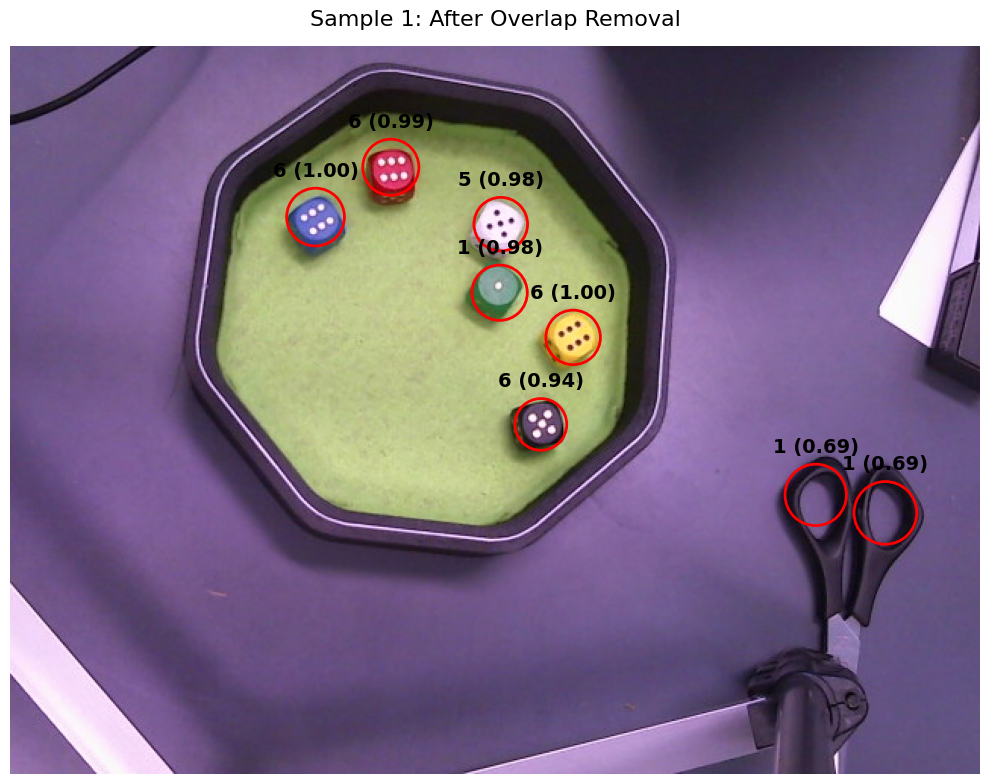

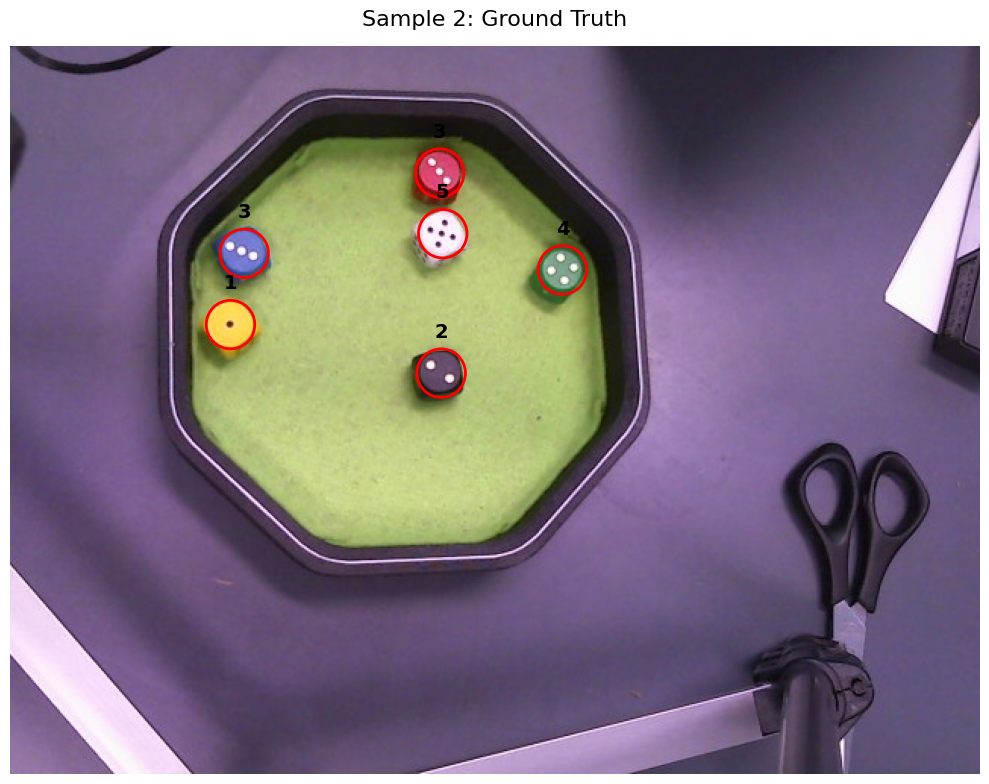

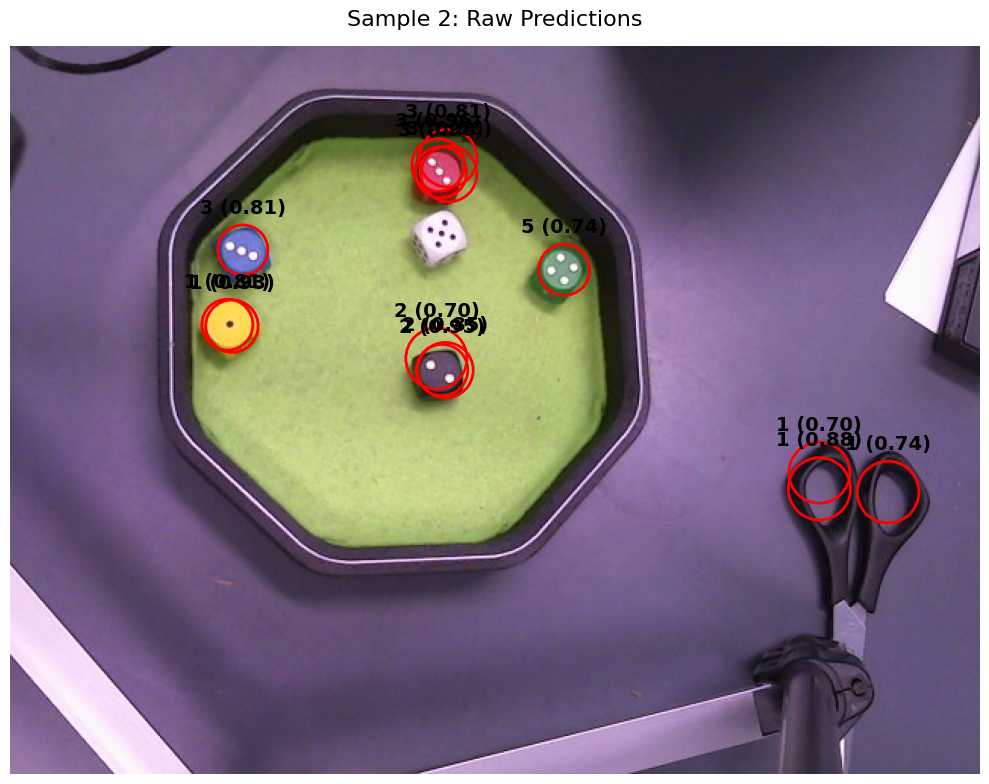

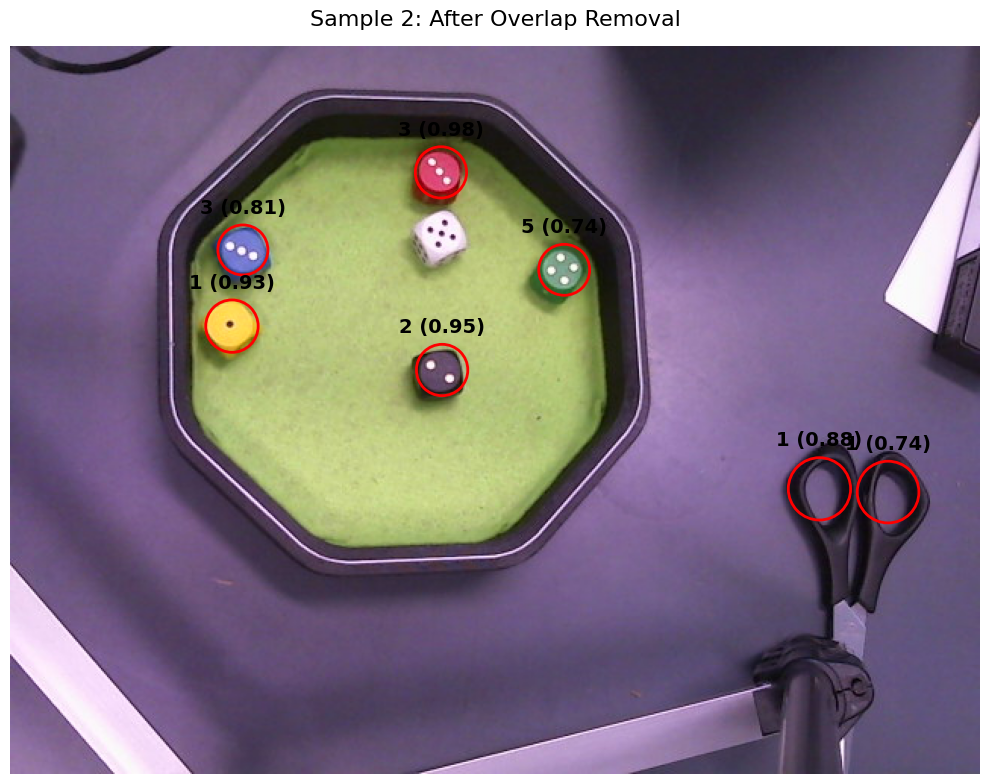

In [14]:
for i, (imgs, clss, regs, masks) in enumerate(test_loader):
    if i >= 3:
        break

    img_hwc = imgs[0].permute(1, 2, 0).cpu().numpy()

    gt_labels = extract_ground_truth(clss[0], regs[0], masks[0])

    raw_preds = get_raw_predictions(model, imgs[0], device, 0.6)
    raw_labels = to_output_format(raw_preds)

    filtered_preds = remove_overlaps(raw_preds, 0.2)
    filtered_labels = to_output_format(filtered_preds)

    visualize_sample(
        img_hwc, 
        gt_labels, 
        f"Sample {i}: Ground Truth"
    )

    visualize_sample(
        img_hwc, 
        raw_labels, 
        f"Sample {i}: Raw Predictions",
        show_confidence=True
    )

    visualize_sample(
        img_hwc, 
        filtered_labels, 
        f"Sample {i}: After Overlap Removal",
        show_confidence=True
    )

In [9]:
tp, fp, fn = 0, 0, 0

for imgs, clss, regs, masks in test_loader:
    gt = extract_ground_truth(clss[0], regs[0], masks[0])

    raw_preds = get_raw_predictions(model, imgs[0], device, 0.5)
    preds = remove_overlaps(raw_preds, iou_threshold=0.2)

    tpi, fpi, fni = evaluate_image(preds, gt)

    tp += tpi
    fp += fpi
    fn += fni

precision, recall, f1 = compute_metrics(tp, fp, fn)

print(f"Precision: {precision:.3f}")
print(f"Recall:    {recall:.3f}")
print(f"F1 score:  {f1:.3f}")

Precision: 0.634
Recall:    0.764
F1 score:  0.693


In [5]:
# # Block 1: Save model from memory
# PATH = 'dice_model_v1.pth'

# torch.save({
#     'model_state_dict': model.state_dict(),
#     'optimizer_state_dict': optimizer.state_dict()
# }, PATH)

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

PATH = 'dice_model1.pth'

model = DiceDetector().to(device)
checkpoint = torch.load(PATH, weights_only=True)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

DiceDetector(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats